In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['figure.figsize'] = 10,7
rcParams['axes.grid'] = True
import seaborn as sns
# Our deep learning library is Keras
from tensorflow.keras.models import Sequential

from keras.models import load_model
from keras.regularizers import l2
import numpy as np
# fixed random seed for reproducibility
np.random.seed(0)
import sys
sys.path.append("c:/ml/lib")
%matplotlib inline

## Read Me

Music Release Year Prediction

## Overview

This Colab notebook is part of a project focused on predicting the release year of songs based on audio features. The dataset used is a subset of the Million Song Dataset (MSD), which spans from 1922 to 2011. The project aims to explore trends in music evolution and leverage machine learning to predict release years.

## Dataset

The dataset consists of audio features, particularly timbre averages and covariances, obtained through segmenting each song into 12 segments. The target variable is the release year of the song.

- *Dataset Source:* [Million Song Dataset (MSD)](http://labrosa.ee.columbia.edu/millionsong/)
- *Data Shape:* (515345, 91)

## Project Components

1. *Exploratory Data Analysis (EDA):*
   - Initial analysis of the Billboard charts from 1950 to 2015 to understand trends in popular music.
   - Exploration of the MSD subset to gain insights into the features and distribution of the data.

2. *Data Preprocessing:*
   - Handling missing values, if any.
   - Feature scaling or normalization to prepare the data for machine learning models.

3. *Machine Learning Models:*
   - Implementation of linear regression for the baseline model.
   - Evaluation and exploration of other models like Random Forest if baseline performance is suboptimal.

4. *Evaluation Metrics:*
   - Assessment of model performance using metrics such as Mean Absolute Error (MAE) and accuracy.

## Instructions

1. *Run the Notebooks Sequentially:*
   - Run each cell sequentially to ensure proper execution and understanding of the step-by-step process.

2. *Customization:*
   - Feel free to customize parameters, explore additional visualizations, or try different machine learning models.

3. *Dataset Access:*
   - Ensure access to the MSD dataset, and update the file path or download instructions if needed.

4. *Contribution:*
   - Contributions and suggestions are welcome! Feel free to fork the repository, make changes, and submit pull requests.

## Acknowledgments

- This project utilizes the Million Song Dataset, and we extend our gratitude to the contributors and maintainers of the dataset.

In [2]:
data = pd.read_csv("year_prediction2.csv")
data = data.rename(index=str, columns={"label":"year"})

In [24]:
data

,year,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515340,2006,51.28467,45.88068,22.19582,-5.53319,-3.61835,-16.36914,2.12652,5.18160,-8.66890,...,4.81440,-3.75991,-30.92584,26.33968,-5.03390,21.86037,-142.29410,3.42901,-41.14721,-15.46052
515341,2006,49.87870,37.93125,18.65987,-3.63581,-27.75665,-18.52988,7.76108,3.56109,-2.50351,...,32.38589,-32.75535,-61.05473,56.65182,15.29965,95.88193,-10.63242,12.96552,92.11633,10.88815
515342,2006,45.12852,12.65758,-38.72018,8.80882,-29.29985,-2.28706,-18.40424,-22.28726,-4.52429,...,-18.73598,-71.15954,-123.98443,121.26989,10.89629,34.62409,-248.61020,-6.07171,53.96319,-8.09364
515343,2006,44.16614,32.38368,-3.34971,-2.49165,-19.59278,-18.67098,8.78428,4.02039,-12.01230,...,67.16763,282.77624,-4.63677,144.00125,21.62652,-29.72432,71.47198,20.32240,14.83107,39.74909


In [5]:
data.columns

Index(['year', 'TimbreAvg1', 'TimbreAvg2', 'TimbreAvg3', 'TimbreAvg4',
       'TimbreAvg5', 'TimbreAvg6', 'TimbreAvg7', 'TimbreAvg8', 'TimbreAvg9',
       'TimbreAvg10', 'TimbreAvg11', 'TimbreAvg12', 'TimbreCovariance1',
       'TimbreCovariance2', 'TimbreCovariance3', 'TimbreCovariance4',
       'TimbreCovariance5', 'TimbreCovariance6', 'TimbreCovariance7',
       'TimbreCovariance8', 'TimbreCovariance9', 'TimbreCovariance10',
       'TimbreCovariance11', 'TimbreCovariance12', 'TimbreCovariance13',
       'TimbreCovariance14', 'TimbreCovariance15', 'TimbreCovariance16',
       'TimbreCovariance17', 'TimbreCovariance18', 'TimbreCovariance19',
       'TimbreCovariance20', 'TimbreCovariance21', 'TimbreCovariance22',
       'TimbreCovariance23', 'TimbreCovariance24', 'TimbreCovariance25',
       'TimbreCovariance26', 'TimbreCovariance27', 'TimbreCovariance28',
       'TimbreCovariance29', 'TimbreCovariance30', 'TimbreCovariance31',
       'TimbreCovariance32', 'TimbreCovariance33', 'Timbr

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 515345 entries, 0 to 515344
Data columns (total 91 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   year                515345 non-null  int64  
 1   TimbreAvg1          515345 non-null  float64
 2   TimbreAvg2          515345 non-null  float64
 3   TimbreAvg3          515345 non-null  float64
 4   TimbreAvg4          515345 non-null  float64
 5   TimbreAvg5          515345 non-null  float64
 6   TimbreAvg6          515345 non-null  float64
 7   TimbreAvg7          515345 non-null  float64
 8   TimbreAvg8          515345 non-null  float64
 9   TimbreAvg9          515345 non-null  float64
 10  TimbreAvg10         515345 non-null  float64
 11  TimbreAvg11         515345 non-null  float64
 12  TimbreAvg12         515345 non-null  float64
 13  TimbreCovariance1   515345 non-null  float64
 14  TimbreCovariance2   515345 non-null  float64
 15  TimbreCovariance3   515345 non-null  fl

In [6]:
data.shape

(515345, 91)

In [7]:
data.describe()

,year,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
count,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,...,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000,515345.000000
mean,1998.397082,43.387126,1.289554,8.658347,1.164124,-6.553601,-9.521975,-2.391089,-1.793236,3.727876,...,15.755406,-73.461500,41.542422,37.934119,0.315751,17.669213,-26.315336,4.458641,20.035136,1.329105
std,10.931046,6.067558,51.580351,35.268585,16.322790,22.860785,12.857751,14.571873,7.963827,10.582861,...,32.099635,175.618889,122.228799,95.050631,16.161764,114.427905,173.977336,13.346557,185.558247,22.088576
min,1922.000000,1.749000,-337.092500,-301.005060,-154.183580,-181.953370,-81.794290,-188.214000,-72.503850,-126.479040,...,-437.722030,-4402.376440,-1810.689190,-3098.350310,-341.789120,-3168.924570,-4319.992320,-236.039260,-7458.378150,-381.424430
25%,1994.000000,39.954690,-26.059520,-11.462710,-8.487500,-20.666450,-18.440990,-10.780600,-6.468420,-2.293660,...,-1.812650,-139.555160,-20.986900,-4.669540,-6.781590,-31.580610,-101.530300,-2.566090,-59.509270,-8.820210
50%,2002.000000,44.258500,8.417850,10.476320,-0.652840,-6.007770,-11.188390,-2.046670,-1.736450,3.822310,...,9.171850,-53.090060,28.791060,33.623630,0.820840,15.598470,-21.204120,3.117640,7.759730,0.053050
75%,2006.000000,47.833890,36.124010,29.764820,8.787540,7.741870,-2.388960,6.508580,2.913450,9.961820,...,26.274480,13.478730,89.661770,77.785800,8.470990,67.794960,52.389330,9.967740,86.351610,9.679520
max,2011.000000,61.970140,384.065730,322.851430,335.771820,262.068870,166.236890,172.402680,126.741270,146.297950,...,840.973380,4469.454870,3210.701700,1734.079690,260.544900,3662.065650,2833.608950,463.419500,7393.398440,677.899630


In [8]:
nsongs = {}  # Assuming you have a dictionary to store the counts for each year

for y in range(1922, 2012):
    nsongs[y] = len(data[data.year == y])
    print("Year=%d, nsongs=%d" % (y, nsongs[y]))

Year=1922, nsongs=6
Year=1923, nsongs=0
Year=1924, nsongs=5
Year=1925, nsongs=7
Year=1926, nsongs=19
Year=1927, nsongs=42
Year=1928, nsongs=52
Year=1929, nsongs=93
Year=1930, nsongs=40
Year=1931, nsongs=35
Year=1932, nsongs=11
Year=1933, nsongs=6
Year=1934, nsongs=29
Year=1935, nsongs=24
Year=1936, nsongs=25
Year=1937, nsongs=28
Year=1938, nsongs=19
Year=1939, nsongs=35
Year=1940, nsongs=52
Year=1941, nsongs=32
Year=1942, nsongs=24
Year=1943, nsongs=14
Year=1944, nsongs=15
Year=1945, nsongs=30
Year=1946, nsongs=29
Year=1947, nsongs=57
Year=1948, nsongs=43
Year=1949, nsongs=60
Year=1950, nsongs=83
Year=1951, nsongs=74
Year=1952, nsongs=77
Year=1953, nsongs=133
Year=1954, nsongs=123
Year=1955, nsongs=275
Year=1956, nsongs=565
Year=1957, nsongs=597
Year=1958, nsongs=583
Year=1959, nsongs=592
Year=1960, nsongs=424
Year=1961, nsongs=571
Year=1962, nsongs=605
Year=1963, nsongs=902
Year=1964, nsongs=945
Year=1965, nsongs=1120
Year=1966, nsongs=1377
Year=1967, nsongs=1718
Year=1968, nsongs=186

count    515345.000000
mean       1998.397082
std          10.931046
min        1922.000000
25%        1994.000000
50%        2002.000000
75%        2006.000000
max        2011.000000
Name: year, dtype: float64


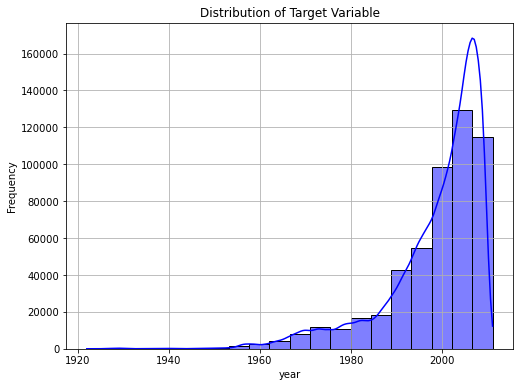

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame and 'year' is the target variable
# If your target variable is 'year', replace it with the correct column name
target_variable = 'year'

# Descriptive Statistics
print(data[target_variable].describe())

# Histogram
plt.figure(figsize=(8, 6))
sns.histplot(data[target_variable], bins=20, kde=True, color='blue')
plt.title('Distribution of Target Variable')
plt.xlabel(target_variable)
plt.ylabel('Frequency')
plt.show()


Text(0, 0.5, 'Number of songs')

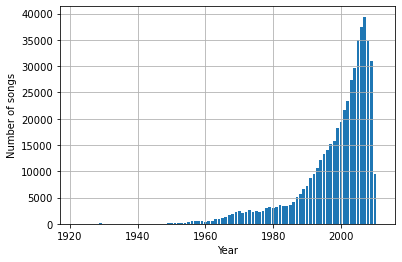

In [10]:
years = range(1922,2012)
values = [nsongs[y] for y in years]
plt.bar(years, values, align='center')
plt.xlabel("Year")
plt.ylabel("Number of songs")

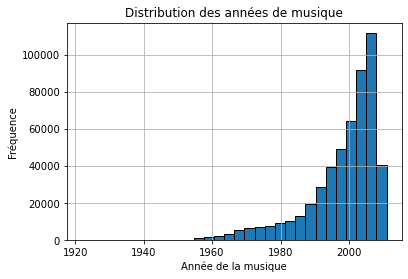

In [11]:
import matplotlib.pyplot as plt

plt.hist(data['year'], bins=30, edgecolor='black')
plt.xlabel('Année de la musique')
plt.ylabel('Fréquence')
plt.title('Distribution des années de musique')
plt.show()

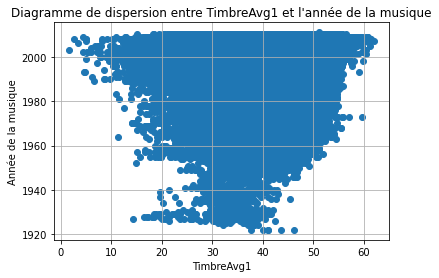

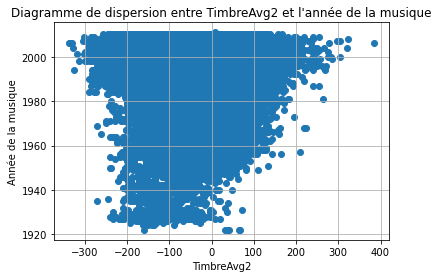

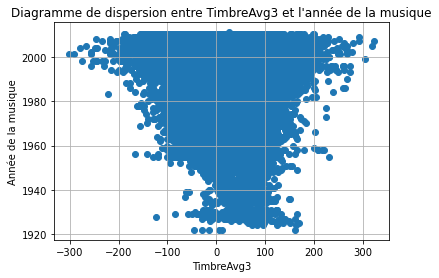

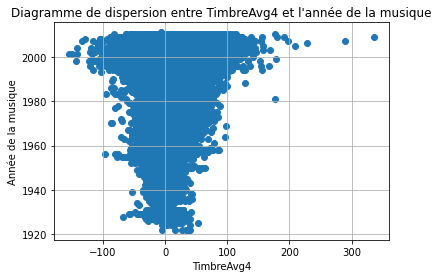

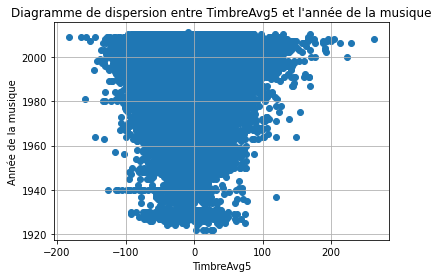

...

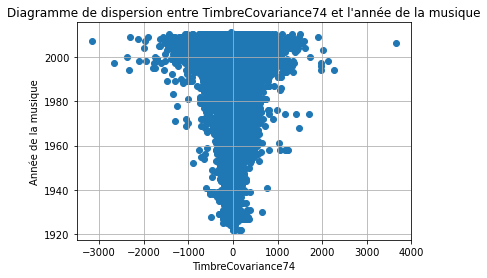

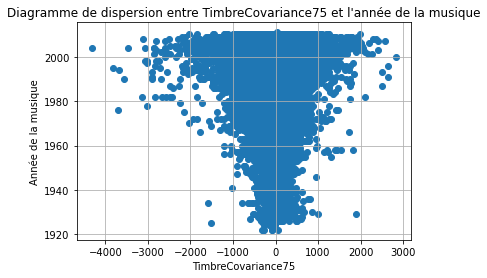

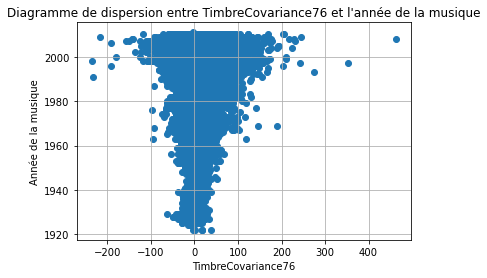

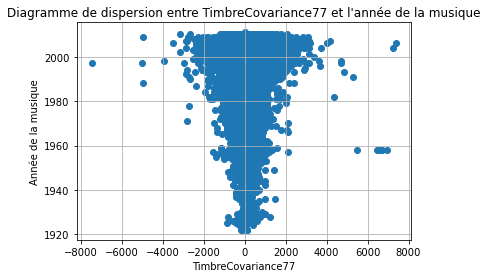

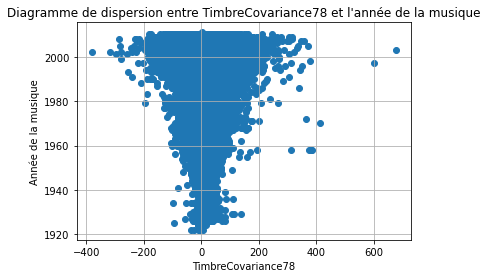

In [12]:
for col in data.columns:
    if col != 'year':
        plt.figure()
        plt.scatter(data[col], data['year'])
        plt.xlabel(col)
        plt.ylabel('Année de la musique')
        plt.title(f'Diagramme de dispersion entre {col} et l\'année de la musique')
        plt.show()

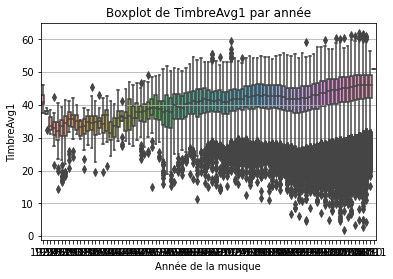

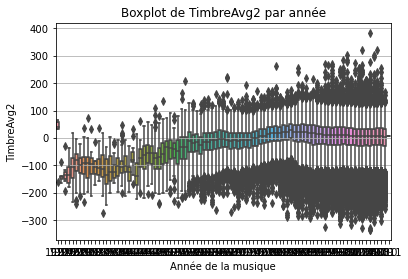

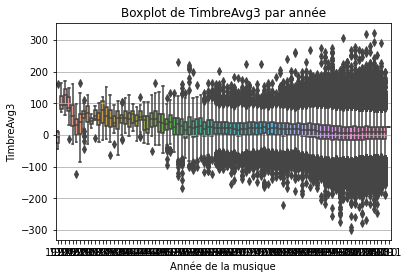

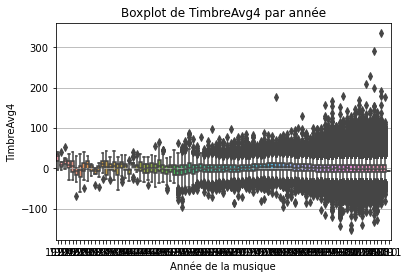

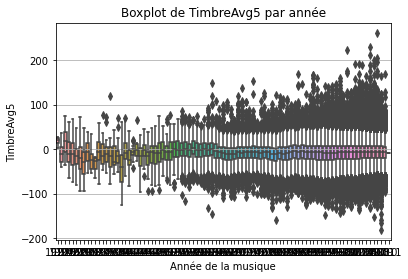

...

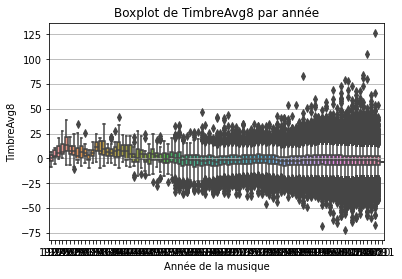

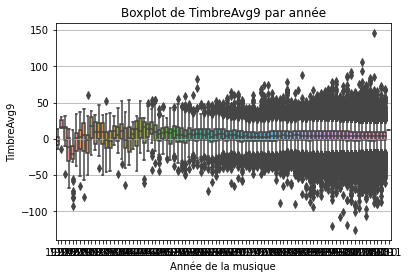

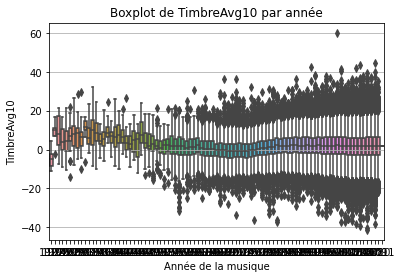

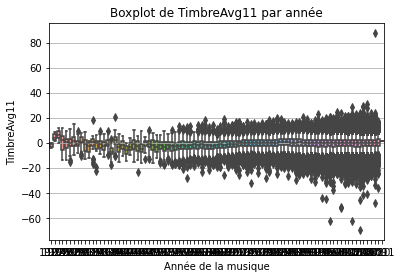

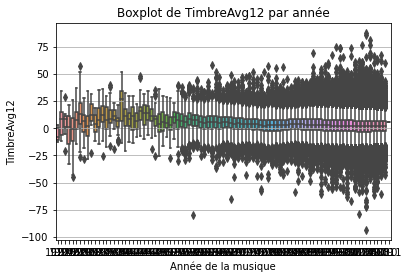

KeyboardInterrupt: 

In [14]:
import seaborn as sns

for col in data.columns:
    if col != 'year':
        plt.figure()
        sns.boxplot(x='year', y=col, data=data)
        plt.xlabel('Année de la musique')
        plt.ylabel(col)
        plt.title(f'Boxplot de {col} par année')
        plt.show()

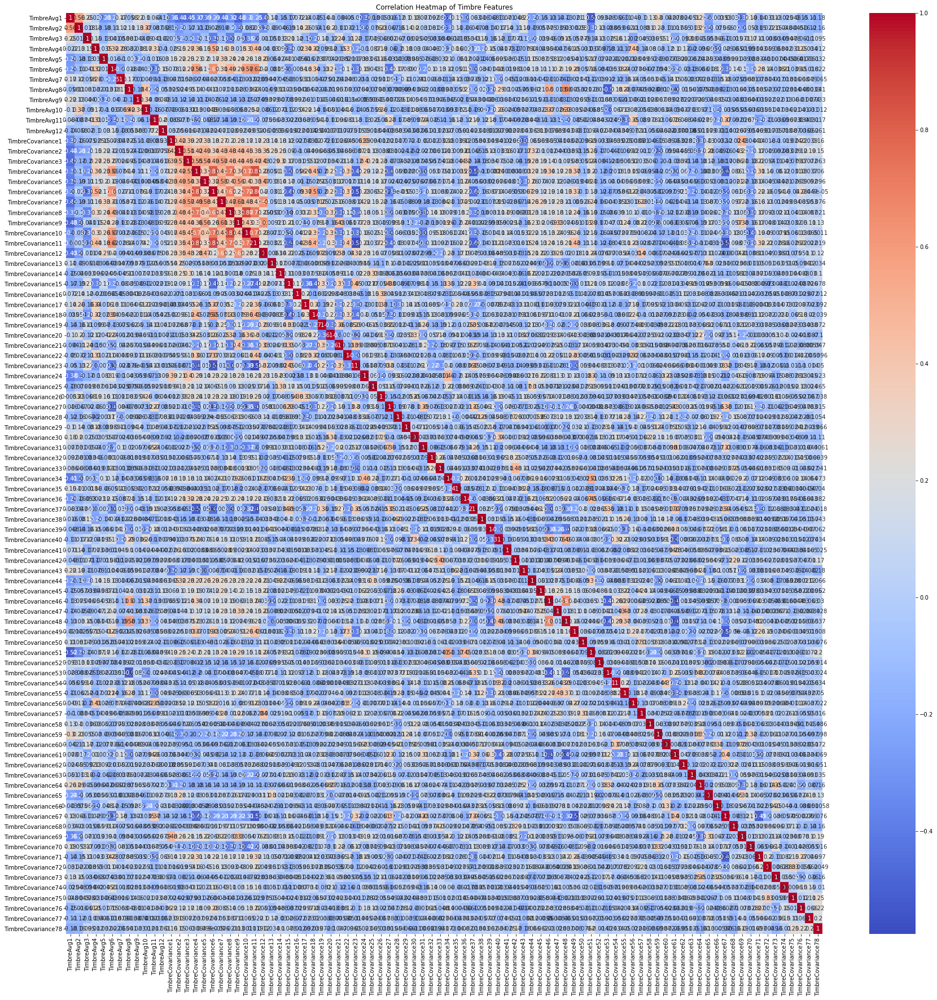

In [26]:
# Correlation Heatmap
correlation_matrix = data.iloc[:, 1:].corr()
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True)
plt.title('Correlation Heatmap of Timbre Features')
plt.show()

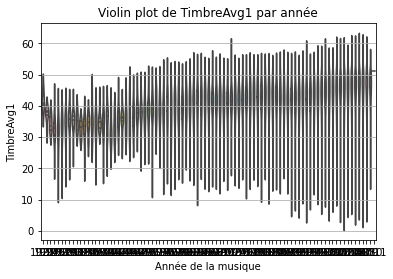

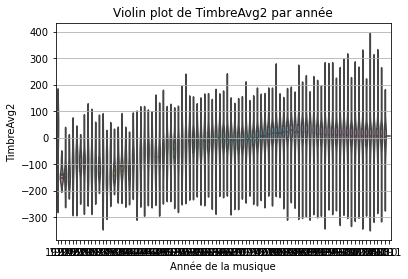

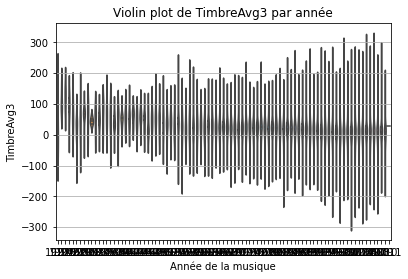

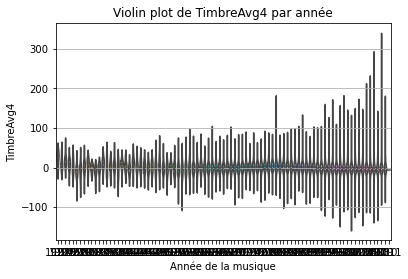

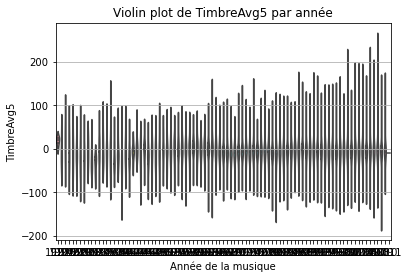

...

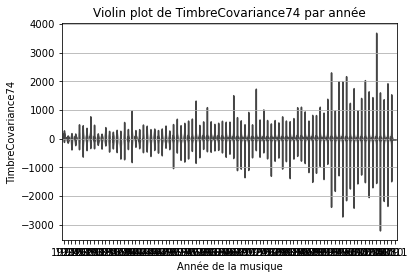

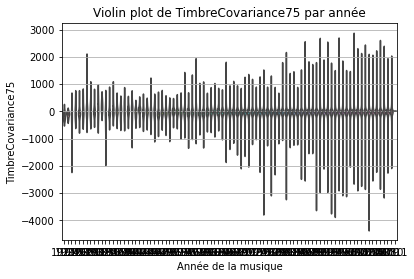

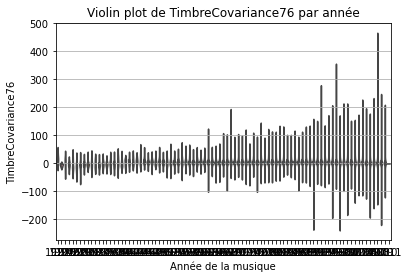

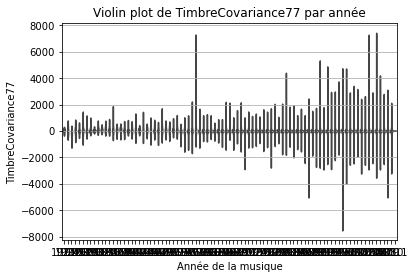

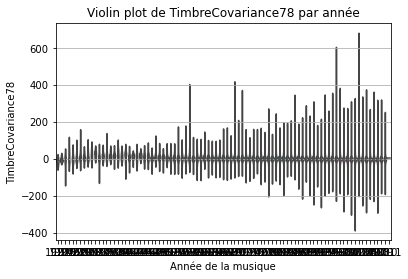

In [27]:
for col in data.columns:
    if col != 'year':
        plt.figure()
        sns.violinplot(x='year', y=col, data=data, inner='quartile')
        plt.xlabel('Année de la musique')
        plt.ylabel(col)
        plt.title(f'Violin plot de {col} par année')
        plt.show()

In [28]:
#checking the Skewness of num features which defines the asymmetry of a distribution
for col in data:
    print(f"{col} has {data[col].skew()} \n")


year has -1.7315499100826381 

TimbreAvg1 has -0.8955087429560068 

TimbreAvg2 has -0.8603225925729394 

TimbreAvg3 has -0.15331956867918176 

TimbreAvg4 has 0.9749332237545638 

TimbreAvg5 has 0.06805720410359582 

TimbreAvg6 has 0.8470794260163325 

TimbreAvg7 has -0.19882917181272944 

TimbreAvg8 has 0.03045359095448083 

TimbreAvg9 has -0.2565819136325055 

TimbreAvg10 has 0.06156505317425385 

TimbreAvg11 has -0.19300093021498368 

TimbreAvg12 has 0.2077025588544961 

TimbreCovariance1 has 2.0534965536673284 

TimbreCovariance2 has 2.9264812963641393 

TimbreCovariance3 has 2.222590302444444 

TimbreCovariance4 has 3.450553170489915 

TimbreCovariance5 has 3.102162949039434 

TimbreCovariance6 has 2.2481844934335813 

TimbreCovariance7 has 2.687219006465667 

TimbreCovariance8 has 2.669198667634166 

TimbreCovariance9 has 3.2828831618342744 

TimbreCovariance10 has 1.9974095270211905 

TimbreCovariance11 has 3.1393675026312775 

TimbreCovariance12 has 4.171231996305473 

TimbreCov

toutes les valeurs sont toutes proches de 0 alors notre data suit une loi normal

In [29]:
#Kurtosis is a measure of the tailedness of a distribution. Tailedness is how often outliers occur
for col in data:
    print(f"{col} has {data[col].kurt()} \n")

year has 3.4938009055004233 

TimbreAvg1 has 1.1303669881149894 

TimbreAvg2 has 1.6797209085573481 

TimbreAvg3 has 2.0839516528050535 

TimbreAvg4 has 5.092128331243712 

TimbreAvg5 has 1.7599323462747645 

TimbreAvg6 has 1.8163705308148215 

TimbreAvg7 has 2.155709777307031 

TimbreAvg8 has 2.5528691813281315 

TimbreAvg9 has 3.282444740309211 

TimbreAvg10 has 0.5688478381281823 

TimbreAvg11 has 2.38852161835426 

TimbreAvg12 has 2.1966227210689206 

TimbreCovariance1 has 9.611133159724625 

TimbreCovariance2 has 22.905721091156828 

TimbreCovariance3 has 11.786667895613922 

TimbreCovariance4 has 32.94201786500258 

TimbreCovariance5 has 33.61913172066659 

TimbreCovariance6 has 11.68894038841515 

TimbreCovariance7 has 25.00717283234406 

TimbreCovariance8 has 16.47578535816677 

TimbreCovariance9 has 36.39887298014909 

TimbreCovariance10 has 9.58744164269894 

TimbreCovariance11 has 27.231921782680004 

TimbreCovariance12 has 74.1562102242238 

TimbreCovariance13 has 12.090714

In [ ]:
#there's a high Kurtosis in all TimbreCovariance au contraire des timbres avg

# DATA CLEANING

on va verifier si il ya des Naan Values ou non 

<AxesSubplot:>

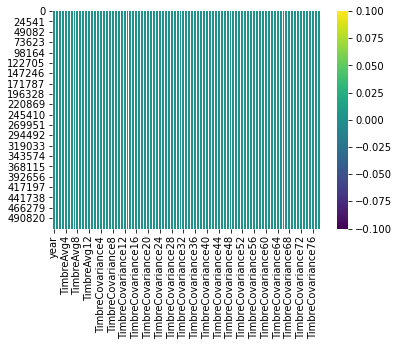

In [3]:
cols =data.columns
sns.heatmap(data[cols].isnull(),cmap='viridis')
#yellow is the missing values
#dark blue is not missing values

In [16]:
data.isnull().sum()

year                  0
TimbreAvg1            0
TimbreAvg2            0
TimbreAvg3            0
TimbreAvg4            0
                     ..
TimbreCovariance74    0
TimbreCovariance75    0
TimbreCovariance76    0
TimbreCovariance77    0
TimbreCovariance78    0
Length: 91, dtype: int64

il ya aucune valeur null

In [3]:
data.shape

(515345, 91)

In [4]:
doublons = data[data.duplicated()]

In [5]:
doublons

,year,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
5551,1973,41.22353,3.20571,43.66712,7.81090,-27.93823,-2.67931,-18.24996,-10.16836,10.21118,...,20.80983,-46.42137,-33.63520,-14.65970,1.63648,52.43969,-17.95543,-2.48364,-104.09383,6.01573
9941,1999,46.98706,38.24010,22.51761,7.24891,-3.88296,-5.25372,12.18594,0.18605,12.75414,...,10.74268,-50.30651,-7.37361,95.50208,5.34527,-22.54009,95.45694,1.57117,-121.46786,-8.07735
9942,1998,43.28314,25.37917,6.80249,16.41132,-14.76744,3.84884,11.74961,2.87696,5.98809,...,8.24654,-76.93471,-130.44354,49.00444,5.17171,-22.77865,196.49517,9.08196,-81.65460,-2.64752
10071,2006,45.88913,3.50835,-16.79630,2.95203,-12.71814,-10.46804,0.08869,16.29474,-0.49840,...,12.71373,-163.83204,-156.44085,165.20790,1.67669,-64.35191,94.78478,-5.55255,23.30911,-6.75154
17330,2008,31.59176,-43.16626,-53.11768,-7.08228,36.23470,-25.61305,-31.75173,-11.16459,22.02261,...,27.60406,-256.30083,-11.62091,119.28601,17.95582,51.36605,-116.69768,4.80931,114.35652,-11.11994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500568,1988,38.97271,35.64567,-57.35630,-12.21976,-46.33510,-2.40727,-13.88561,-1.84301,0.86373,...,11.23003,-129.69128,-66.70936,13.65987,-5.99570,139.55599,-227.12107,11.44736,-82.32164,-5.94241
505982,2002,41.71236,-74.26705,-1.79009,2.35874,-41.19781,4.17658,-13.86373,2.79708,-1.92353,...,-1.52568,-341.90923,77.86735,208.76815,-19.98203,64.68677,-147.48197,14.85343,-76.69082,-16.05562
507253,2005,45.80278,31.58951,-7.59075,-14.01903,-18.81706,-7.66548,-9.95065,-2.58846,4.83188,...,63.15197,10.50641,247.87142,66.71739,12.37958,6.93733,104.76817,22.78140,-151.14191,19.05184
507479,2008,43.46480,-10.83611,31.90017,-13.44218,-11.36997,2.02308,-27.88310,-4.38305,20.88566,...,52.10270,74.33104,128.10386,35.25644,14.86020,164.93570,25.08485,9.54500,-111.64292,16.17438


In [6]:
Newdata=data.drop_duplicates()

In [7]:
Newdata.shape

(515131, 91)

In [20]:
Newdata

,year,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515340,2006,51.28467,45.88068,22.19582,-5.53319,-3.61835,-16.36914,2.12652,5.18160,-8.66890,...,4.81440,-3.75991,-30.92584,26.33968,-5.03390,21.86037,-142.29410,3.42901,-41.14721,-15.46052
515341,2006,49.87870,37.93125,18.65987,-3.63581,-27.75665,-18.52988,7.76108,3.56109,-2.50351,...,32.38589,-32.75535,-61.05473,56.65182,15.29965,95.88193,-10.63242,12.96552,92.11633,10.88815
515342,2006,45.12852,12.65758,-38.72018,8.80882,-29.29985,-2.28706,-18.40424,-22.28726,-4.52429,...,-18.73598,-71.15954,-123.98443,121.26989,10.89629,34.62409,-248.61020,-6.07171,53.96319,-8.09364
515343,2006,44.16614,32.38368,-3.34971,-2.49165,-19.59278,-18.67098,8.78428,4.02039,-12.01230,...,67.16763,282.77624,-4.63677,144.00125,21.62652,-29.72432,71.47198,20.32240,14.83107,39.74909


on remarque que 214 chansons dupliquees on ete supprimé 

In [8]:
indicateurs_aberration = pd.DataFrame()

# Boucle à travers chaque colonne numérique
for col in Newdata:
    Q1 = Newdata[col].quantile(0.25)
    Q3 = Newdata[col].quantile(0.75)
    IQR = Q3 - Q1
    
    # Identifier les valeurs aberrantes dans la colonne
    outliers = (Newdata[col] < Q1 - 1.5 * IQR) | (Newdata[col] > Q3 + 1.5 * IQR)
    
    # Stocker les indicateurs d'aberration dans le DataFrame
    indicateurs_aberration[col] = outliers

# 'indicateurs_aberration' contient maintenant True si la valeur correspondante dans 'data' est une aberration

In [9]:
indicateurs_aberration 

,year,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515340,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
515341,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
515342,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
515343,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,True


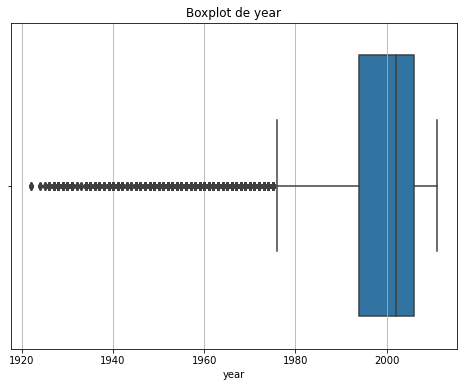

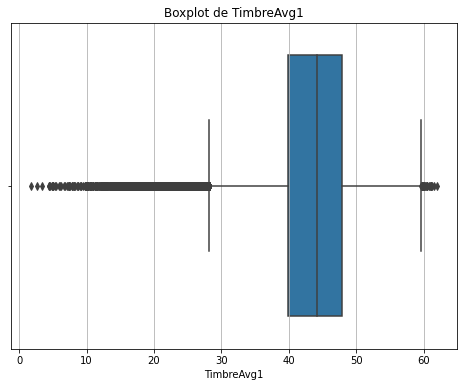

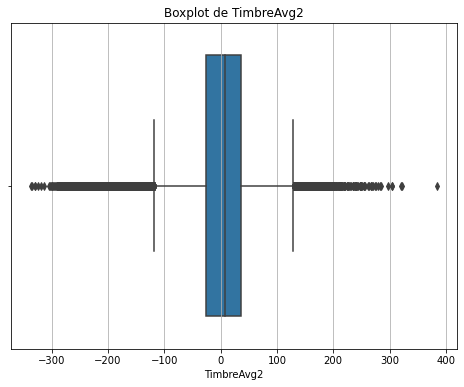

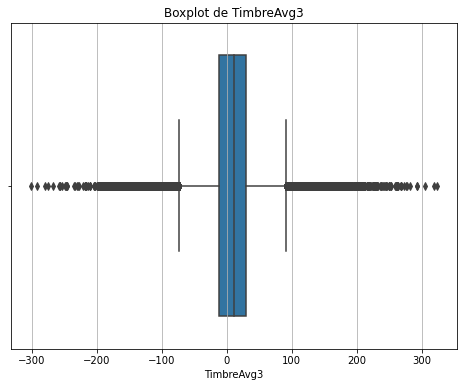

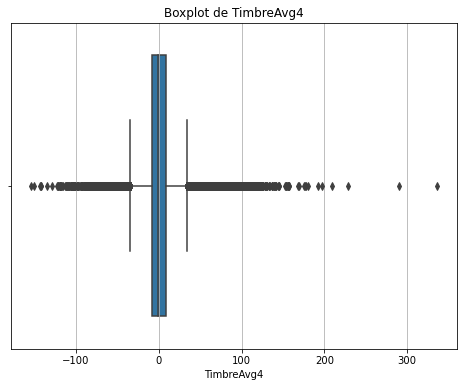

...

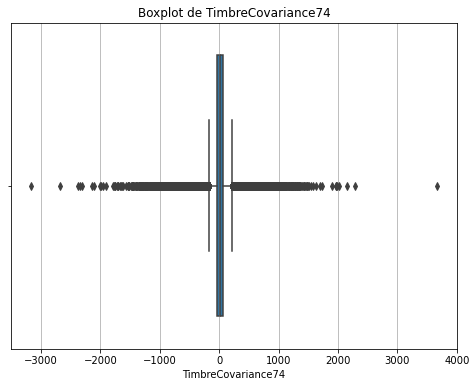

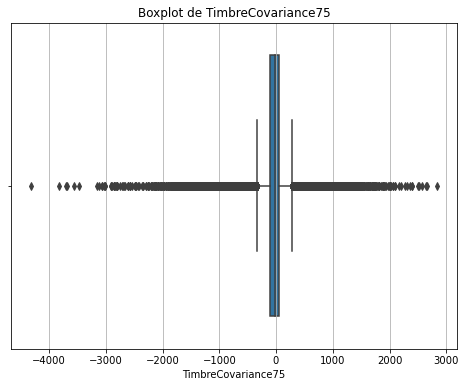

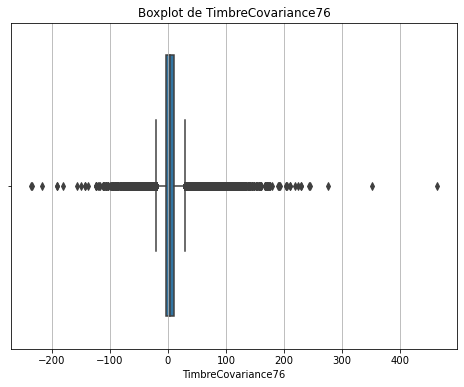

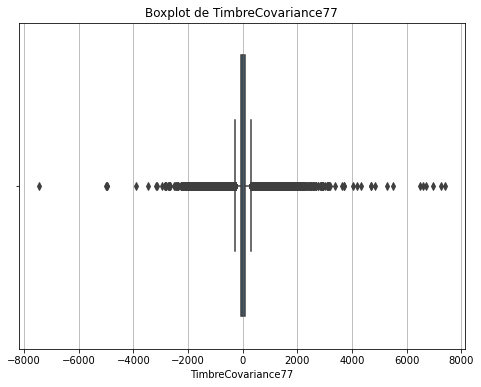

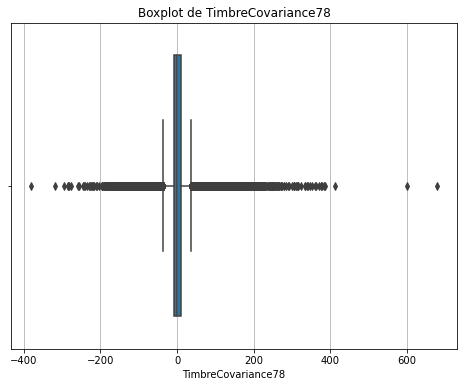

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt



# Créez des boxplots pour chaque colonne numérique
for col in Newdata:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=data[col])
    plt.title(f'Boxplot de {col}')
    plt.show()

on va voir les valeurs abberantes par rapport a la data 

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(indicateurs_aberration, cmap='viridis', cbar=False)
plt.title('Heatmap des Valeurs Aberrantes')
plt.show()

negligable donc on peut les  supprimer 

In [10]:
# Supprimer les lignes avec des valeurs aberrantes
Newdata2=Newdata[~outliers]

In [11]:
Newdata2.shape

(475673, 91)

# PART2

In [12]:
Y= Newdata2['year']
X= Newdata2.drop(['year'], axis=1)


In [13]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature matrix and target variable
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [14]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)


X_train shape: (380538, 90)
X_test shape: (95135, 90)


# PCA

In [15]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Fit on training set only.
scaler.fit(X_train)
# Apply transform to both the train set and the test set.
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train = pd.DataFrame(X_train_scaled,columns=X_train.columns)
X_test = pd.DataFrame(X_test_scaled,columns=X_train.columns)

In [16]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# Fit on training set only.
scaler.fit(X_train)
# Apply transform to both the train set and the test set.
X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)

In [17]:
X_train_std = pd.DataFrame(X_train_std,columns=X_train.columns)
X_train_std.describe()

,TimbreAvg1,TimbreAvg2,TimbreAvg3,TimbreAvg4,TimbreAvg5,TimbreAvg6,TimbreAvg7,TimbreAvg8,TimbreAvg9,TimbreAvg10,...,TimbreCovariance69,TimbreCovariance70,TimbreCovariance71,TimbreCovariance72,TimbreCovariance73,TimbreCovariance74,TimbreCovariance75,TimbreCovariance76,TimbreCovariance77,TimbreCovariance78
count,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,...,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05,3.805380e+05
mean,-5.822058e-16,-2.522385e-15,-2.117977e-15,-2.395307e-15,-1.046173e-15,7.918262e-16,1.879494e-15,6.656227e-16,-1.814676e-15,2.315125e-16,...,6.319021e-16,-4.222011e-15,-1.429090e-15,9.520983e-16,-1.584192e-15,7.136999e-15,-1.768215e-16,-6.502378e-16,5.726711e-15,-2.719579e-16
std,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,...,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00
min,-7.187793e+00,-6.782571e+00,-8.960550e+00,-9.683576e+00,-7.800270e+00,-5.686828e+00,-1.303726e+01,-8.938672e+00,-1.190732e+01,-6.679205e+00,...,-9.140913e+00,-2.584386e+01,-1.346001e+01,-2.236611e+01,-1.499827e+01,-2.950801e+01,-2.447169e+01,-1.816112e+01,-1.993382e+01,-2.648367e+00
25%,-5.685747e-01,-5.278730e-01,-5.700341e-01,-5.966112e-01,-6.196515e-01,-6.992618e-01,-5.812464e-01,-5.879323e-01,-5.767678e-01,-6.628495e-01,...,-5.690533e-01,-3.786104e-01,-5.152267e-01,-4.839395e-01,-4.649497e-01,-4.485202e-01,-4.901647e-01,-5.391320e-01,-4.856297e-01,-6.074445e-01
50%,1.376788e-01,1.343617e-01,5.778703e-02,-1.157243e-01,2.954754e-02,-1.280162e-01,2.119150e-02,9.999781e-03,4.977644e-03,-1.238785e-02,...,-1.878714e-01,1.230296e-01,-9.963342e-02,-5.142820e-02,2.193766e-02,-2.745594e-02,3.216962e-02,-9.373960e-02,-6.082919e-02,-2.096196e-02
75%,7.321899e-01,6.714121e-01,6.075162e-01,4.681838e-01,6.353833e-01,5.620898e-01,6.144015e-01,5.963943e-01,5.904730e-01,6.562130e-01,...,3.774406e-01,5.084046e-01,4.041449e-01,4.471959e-01,5.202998e-01,4.448414e-01,5.090911e-01,4.341546e-01,4.257686e-01,5.877160e-01
max,3.116514e+00,6.305783e+00,9.113099e+00,1.794213e+01,1.198383e+01,9.626473e+00,1.224212e+01,1.355336e+01,1.374649e+01,6.551986e+00,...,1.816371e+01,1.126690e+01,2.717788e+01,1.734837e+01,1.345333e+01,3.372122e+01,1.363534e+01,2.225909e+01,4.944563e+01,2.699707e+00


In [18]:
from sklearn.decomposition import PCA
# Make an instance of the Model
pca = PCA(.90)

# We fit to only our training set
pca.fit(X_train_std)
# Print number of components generated
pca.n_components_

56

In [19]:
import pandas as pd

# Convert X_test_std to a DataFrame if it's a NumPy array
X_test_std_df = pd.DataFrame(X_test_std, columns=X_train_std.columns)

# Drop rows with missing values in both training and testing data
X_train_std_no_missing = X_train_std.dropna()
X_test_std_no_missing = X_test_std_df.dropna()

# Now, proceed with PCA on the data without missing values
X_train_proc = pca.transform(X_train_std_no_missing)
X_test_proc = pca.transform(X_test_std_no_missing)

In [20]:
y_train_proc = y_train - min(y_train)
y_test_proc = y_test - min(y_test)
# y_train_proc

# Neural N


In [40]:
from tensorflow.python.keras import Sequential
from tensorflow.python.keras.layers import Dense, Lambda, Dropout
# from tensorflow.python.keras.initializers import Initializer

from tensorflow.python.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [43]:

from keras.utils import to_categorical

In [44]:
y_train_hot = to_categorical(y_train_proc, 90)
y_test_hot = to_categorical(y_test_proc, 90)

In [45]:
print(X_train_proc.shape)
print(y_test_hot.shape)

(380538, 56)
(95135, 90)


In [48]:
def plot(history):
    epochs = range(1, len(history.history['loss']) + 1)
    plt.plot(epochs, history.history['mean_absolute_error'], label='train')
    plt.plot(epochs, history.history['val_mean_absolute_error'], label='val')
    plt.xlabel('epoch')
    plt.ylabel('mae')
    plt.legend()
    plt.show()

In [61]:
model1 = Sequential()
model1.add(Dense(55, input_shape=(56,)))  # Update input shape to 56
model1.add(Dense(110))
model1.add(Dense(90, activation='softmax'))

In [62]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)

In [63]:
model1.compile(optimizer='adam'
             , loss='categorical_crossentropy'
             , metrics=['accuracy'])

In [64]:
fit1 = model1.fit(x=X_train_proc, y=y_train_hot
          , epochs=5
          , batch_size=64
          , validation_data=(X_test_proc, y_test_hot)
          , callbacks=[learning_rate_reduction])

Epoch 1/5
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
5942/5946 [============================>.] - ETA: 0s - loss: 3.3555 - accuracy: 0.0744WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002B4C4BE3310> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, s

In [65]:
model1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 55)                3135      
_________________________________________________________________
dense_7 (Dense)              (None, 110)               6160      
_________________________________________________________________
dense_8 (Dense)              (None, 90)                9990      
Total params: 19,285
Trainable params: 19,285
Non-trainable params: 0
_________________________________________________________________


In [66]:
preds = model1.predict_classes(X_test_proc)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


C:\Users\21658\anaconda3\lib\site-packages\tensorflow\python\keras\engine\sequential.py:454: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


In [67]:
print(np.array(y_test_proc))
print(preds)
np.mean(np.absolute((preds-np.array(y_test_proc))))

[47 82 81 ... 75 76 76]
[51 87 82 ... 86 82 82]


9.357039995795448

In [72]:
model2 = Sequential()
model2.add(Dense(55, input_shape=(56,), activation='relu'))
model2.add(Dense(1))

In [74]:
learning_rate_reduction1 = ReduceLROnPlateau(monitor='mean_absolute_error', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)

In [75]:
model2.compile(optimizer='adam'
             , loss='mse'
             , metrics=['mae'])

In [76]:
fit2 = model2.fit(x=X_train_proc, y=y_train_proc
          , epochs=10
          , batch_size=64
          , validation_data=(X_test_proc, y_test_proc)
          , callbacks=[learning_rate_reduction1])

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
5939/5946 [============================>.] - ETA: 0s - loss: 504.4636 - mae: 14.9058 ETA: 0s - loss: 522.8396 - mae:WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002B4B91CAF70> and will run it as-is.
Please report this to the TensorFl

In [77]:
preds_model_rms = model2.predict(X_test_proc)
np.mean(np.absolute(preds_model_rms.T-np.array(y_test_proc)))

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


6.717623846112519

In [79]:
# from sklearn.metrics import mean_squared_error, r2_score
# mean_squared_error(predictions_linearRegr, np.array(y_test_proc))
es = EarlyStopping(monitor='val_mean_absolute_error', patience=2, restore_best_weights=True)

In [80]:
model3 = Sequential()
model3.add(Dense(55, input_shape=(56,), activation='relu'))
model3.add(Dense(110, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(1))

model3.compile(optimizer='adam'
             , loss='mse'
             , metrics=['mae'])

In [81]:
fit3 = model3.fit(x=X_train_proc, y=y_train_proc
          , epochs=10
          , batch_size=64
          , validation_data=(X_test_proc, y_test_proc)
          , callbacks=[learning_rate_reduction1, es])

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
5923/5946 [============================>.] - ETA: 0s - loss: 241.6557 - mae: 10.9144WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002B4C4B84940> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, se

In [82]:
preds_model_rms = model3.predict(X_test_proc)
np.mean(np.absolute(preds_model_rms.T-np.array(y_test_proc)))

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


6.642207396933252

In [83]:
model3.compile(optimizer='adam'
             , loss='mse'
             , metrics=['mae'])
fit3 = model3.fit(x=X_train_proc, y=y_train_proc
          , epochs=10
          , batch_size=128
          , validation_data=(X_test_proc, y_test_proc)
          , callbacks=[learning_rate_reduction1, es])

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2967/2973 [============================>.] - ETA: 0s - loss: 105.9459 - mae: 7.7497WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002B4B8B605E0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set

In [84]:
preds_model_rms = model3.predict(X_test_proc)
np.mean(np.absolute(preds_model_rms.T-np.array(y_test_proc)))

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


6.537393306965346

In [85]:
from keras.optimizers import RMSprop

In [86]:
model3.compile(optimizer='RMSprop'
             , loss='mse'
             , metrics=['mae'])
fit4 = model3.fit(x=X_train_proc, y=y_train_proc
          , epochs=10
          , batch_size=64
          , validation_data=(X_test_proc, y_test_proc)
          , callbacks=[learning_rate_reduction1, es])

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
5911/5946 [============================>.] - ETA: 0s - loss: 100.8645 - mae: 7.5035WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002B4B8C26160> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set

In [87]:
preds_model_rms = model3.predict(X_test_proc)
np.mean(np.absolute(preds_model_rms.T-np.array(y_test_proc)))

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


6.6607520362235295

# Decision Tree Model

In [25]:
#Fit, predict                             
from sklearn.tree import DecisionTreeClassifier
cf1= DecisionTreeClassifier()
cf1=cf1.fit(X_train, y_train)

In [26]:
from sklearn.metrics import mean_absolute_error

# Predictions on the test set
y_pred = cf1.predict(X_test)

# Calculate MAER
maer = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error Rate (MAER):', maer)

Mean Absolute Error Rate (MAER): 8.801797445735009


# Logistic regression

In [21]:
from sklearn.linear_model import LogisticRegression

logisticRegr = LogisticRegression(verbose=10)
logisticRegr.fit(X_train_proc, y_train_proc)
predictions = logisticRegr.predict(X_test_proc)
score = logisticRegr.score(X_test_proc, y_test_proc)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\21658\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.3min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.3min finished


In [22]:
predictions = logisticRegr.predict(X_test_proc)
np.mean(np.absolute((predictions-np.array(y_test_proc))))

9.560245966258474

# Linear regression

In [23]:
from sklearn.linear_model import LinearRegression

linearRegr = LinearRegression()

In [24]:
linearRegr.fit(X_train_proc, y_train_proc)

LinearRegression()

In [25]:
predictions_linearRegr = linearRegr.predict(X_test_proc)
np.mean(np.absolute((predictions_linearRegr-np.array(y_test_proc))))

7.207838925602165